In [226]:
### This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import tensorflow as tf
import pickle
from collections import defaultdict
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input, decode_predictions
from tensorflow.keras.models import Model
from nltk.translate.bleu_score import corpus_bleu
from tensorflow.keras.preprocessing.text import Tokenizer
from PIL import Image
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical
from tqdm.notebook import tqdm
from tensorflow.keras.preprocessing import image
from keras.layers import Input, Dense, Embedding, LSTM, Add, Dropout, Reshape, Concatenate
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from keras.utils import plot_model
from sklearn.model_selection import train_test_split
import os
import logging
logging.basicConfig(level=logging.WARNING)

## Step 1: Convolution Neural Network

* ###  loads the ResNet50 model pre-trained on ImageNet dataset. It initializes the model with weights pre-trained on ImageNet and excludes the top classification layers. The input shape is set to (224, 224, 3), which corresponds to RGB images of size 224x224 pixels.


In [91]:
#loading resnet model
resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
for layer in resnet.layers:
    layer.trainable = False

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [132]:
resnet.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,587,712 (89.98 MB)

* ### Adding Global Average Pooling Layer

In [133]:
#adding global average pooling layer
last_layer = GlobalAveragePooling2D()(resnet.output)
cnn_model = Model(inputs=resnet.input, outputs=last_layer)
cnn_model.summary()

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
# data pathes
images_path = '/kaggle/input/flickr8k/Images'
captions_path = '/kaggle/input/flickr8k/captions.txt'

* ### Load and clean the images

In [227]:
def load_and_preprocess_image(image_path):
    # Load the image with the target size of 224x224
    img = image.load_img(image_path, target_size=(224, 224))
    # Convert the image to a numpy array
    img_arr = image.img_to_array(img)
    # Expand dimensions to match the model's input shape (batch size, height, width, channels)
    img_arr = np.expand_dims(img_arr, axis=0)
    # Preprocess the image for the ResNet-50 model
    clean_img = tf.keras.applications.resnet50.preprocess_input(img_arr)
    return clean_img

* ### Extract image features just before the last layer of classification.

In [ ]:
# Initialize an empty dictionary to store the features
features = {}

# List all files in the directory
files = os.listdir(images_path)

# Iterate through each file in the directory with a progress bar
for image_file in tqdm(files):
    # Construct the full path to the image file
    image_path = os.path.join(images_path, image_file)
    
    # Load and preprocess the image
    claen_img = load_and_preprocess_image(image_path)
    
    # Extract the image's base name without extension to use as a key
    key = image_file.split('.')[0]
    
    # Pass the preprocessed image through the CNN model to get features
    value = cnn_model(claen_img)
    
    # Store the features in the dictionary with the image base name as the key
    features[key] = value

* ### Save images to pickle file to use it faster

In [ ]:
# Define the name of the pickle file to save the features
pickle_file = 'features.pkl'

# Save the features dictionary to a pickle file
with open(pickle_file, 'wb') as f:
    pickle.dump(features, f)

# Verify that the features have been saved successfully
print(f"Features successfully saved to {pickle_file}")

* ### Load the features from the pickle file to get the features to use it 

In [3]:
# Specify the path to the pickle file containing the features
pickle_file = '/kaggle/input/features/features.pkl'

# Open the pickle file in binary read mode ('rb')
with open(pickle_file, 'rb') as f:
    # Load the contents of the pickle file into the variable 'features'
    features = pickle.load(f)

# Print the number of elements in the 'features' object
print(len(features))

8091


## Step 2: Preprocessing Captions for RNN:

* ### Load the captions from the 

In [4]:
with open("/kaggle/input/flickr8k/captions.txt", 'r') as file:
    next(file) # skip the the first line with dummy data
    captions_txt = file.read()

* ### Process Captions and Build Caption Map

In [8]:
# Initialize a defaultdict with lists as default values to store captions associated with image IDs
captions_map = defaultdict(list)

# Iterate over each line in the captions_txt string, splitting it by newline characters
for line in tqdm(captions_txt.split('\n')):
    # Skip empty lines (lines with length less than 2)
    if len(line) < 2:
        continue
    
    # Split the line by commas to separate image ID and caption
    tokens = line.split(',')
    
    # Extract the image ID from the first token (removing file extension if any)
    image_id, caption = tokens[0].split('.')[0], " ".join(tokens[1:])
    
    # Append the caption to the list associated with the image ID in the defaultdict
    captions_map[image_id].append(caption)

# Get the total number of unique image IDs (length of the captions_map dictionary)
len(captions_map)

  0%|          | 0/40456 [00:00<?, ?it/s]

8091

* ### Cleaning the captions and adding start and end indicators to the captions

In [9]:
# Initialize an empty list to store processed captions
captions = []

# Loop through each key-value pair in the captions_map dictionary
for key, captions_list in captions_map.items():
    # Loop through each caption in the list of captions
    for index in range(len(captions_list)):
        # Get the current caption
        caption = captions_list[index]
        # Convert the caption to lowercase
        caption = caption.lower()
        # Remove all characters that are not letters (A-Z or a-z) using regex pattern "[^A-Za-z]"
        caption = caption.replace("[^A-Za-z]", "")
        # Replace multiple whitespace characters with a single space
        caption = caption.replace('\s+', " ")
        # Add "startseq" at the beginning and "endseq" at the end of the caption
        caption = "startseq " + " ".join([word for word in caption.split() if len(word) > 1]) + " endseq"
        # Update the caption in the original list with the processed caption
        captions_list[index] = caption
        # Add the processed caption to the captions list
        captions.append(caption)

# Get the length of the captions list
len(captions)

40455

* ### Initializing Tokenizer and Building Vocabulary

In [10]:
# Initialize a Tokenizer object
tokenizer = Tokenizer()

# Fit the tokenizer on the captions to create a vocabulary
tokenizer.fit_on_texts(captions)

# Get the vocabulary size by adding 1 to the length of the word index
vocab_size = len(tokenizer.word_index) + 1
print(vocab_size)

# Get the maximum length of captions by finding the maximum number of words in a caption
max_len = max(len(caption.split()) for caption in captions)
print(max_len)

8485
35


* ### splite the data Training Set Contains 6000 images, ValidationSet: Consists of 1000 images. And Test Set: Includes 1000 images.

In [11]:
# Get a list of image IDs from the keys of the captions_map dictionary
image_ids = list(captions_map.keys())

# Split the data into test and remaining data
# Use test_size=1091 for test data, and set a random state for reproducibility
remaining_data, test_data = train_test_split(image_ids, test_size=1091, random_state=42)

# Split the remaining data into train and validation data
# Use test_size=1000 for validation data, and set a random state for reproducibility
train_data, validation_data = train_test_split(remaining_data, test_size=1000, random_state=42)

# Print the lengths of test, train, and validation data
print(len(test_data))
print(len(train_data))
print(len(validation_data))

1091
6000
1000


## Step 3: Generating Data for Model Training

In [87]:
def generate_data(data_keys, captions_map, image_features, tokenizer, max_length, vocab_size, batch_size):
    #count to indecate number of batches
    count = 0
    # Infinite loop to continuously generate batches
    while True:
        # Initialize empty lists to store batch data
        batch_image, batch_input, batch_output = [], [], []
        
        # Iterate through each image key in the data_keys list
        for key in data_keys:
            # Iterate through each caption for the current image key
            count += 1
            for caption in captions_map[key]:
                # Tokenize and encode the caption sequence using the tokenizer
                seq = tokenizer.texts_to_sequences([caption])[0]
                
                # Create input-output pairs from the sequence
                for i in range(1, len(seq)):
                    # Split the sequence into input and output pairs
                    input_seq, output_seq = seq[:i], seq[i]
                    
                    # Pad the input sequence to match the maximum length
                    input_seq = pad_sequences([input_seq], maxlen=max_length)[0]
                    
                    # Encode the output sequence as one-hot vector
                    output_seq = to_categorical([output_seq], num_classes=vocab_size)[0]
                    
                    # Store the sequences in batch lists
                    batch_image.append(image_features[key][0])  # Image feature
                    batch_input.append(input_seq)  # Input sequence
                    batch_output.append(output_seq)  # Output sequence
                    
                    # Check if the batch size is reached
                    if count == batch_size:
                        # Yield the batch data as a generator
                        yield {"image_features": np.array(batch_image), "input_seqs": np.array(batch_input)}, np.array(batch_output)
                        
                        # Reset the batch lists for the next batch
                        batch_image, batch_input, batch_output = [], [], []
                        count = 0


## Step 4: Creating the Model Architecture and Adding the Optimizer(adam)

In [66]:
def create_model(vocab_size, max_length):
    # Define input layers with meaningful names
    image_input = Input(shape=(2048,), name="image_features")
    text_input = Input(shape=(max_length,), name="input_seqs")
    
    # Dense layer for image_input
    dense_image = Dense(256, activation='relu', name='dense_image')(image_input)
    
    # Reshape layer to match LSTM output shape
    reshape_dense_image = Reshape((1, 256), name='reshape_dense_image')(dense_image)
    
    # Embedding layer for text_input
    embedding_text = Embedding(vocab_size, 256, name='embedding_text')(text_input)
    
    # Concatenate reshape_dense_image and embedding_text
    concatenated_layers = Concatenate(axis=1, name='concatenated_layers')([reshape_dense_image, embedding_text])
    
    # LSTM layer
    lstm_layer = LSTM(256, name='lstm_layer')(concatenated_layers)
    
    # Dropout layer after LSTM
    dropout_lstm = Dropout(0.3, name='dropout_lstm')(lstm_layer)
    
    # Add the output of dense_image and dropout_lstm
    added_layer = Add(name='added_layer')([dense_image, dropout_lstm])
    
    # Dense layer for further processing
    dense_further = Dense(256, activation='relu', name='dense_further')(added_layer)
    
    # Dropout layer after dense_further
    dropout_further = Dropout(0.3, name='dropout_further')(dense_further)
    
    # Output layer
    output_layer = Dense(vocab_size, activation='softmax', name='output_layer')(dropout_further)
    
    # Define the model
    model = Model(inputs=[image_input, text_input], outputs=output_layer)
    
    # Compile the model
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    return model


* ### Show the model Architecture

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ image_features      │ (None, 2048)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_image (Dense) │ (None, 256)       │    524,544 │ image_features[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_seqs          │ (None, 35)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_dense_image │ (None, 1, 256)    │          0 │ dense_image[0][0] │
│ (Reshape)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding_text      │ (None, 35, 256)   │  2,172,160 │ input_seqs[0][0]  │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenated_layers │ (None, 36, 256)   │          0 │ reshape_dense_im… │
│ (Concatenate)       │                   │            │ embedding_text[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_layer (LSTM)   │ (None, 256)       │    525,312 │ concatenated_lay… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_lstm        │ (None, 256)       │          0 │ lstm_layer[0][0]  │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ added_layer (Add)   │ (None, 256)       │          0 │ dense_image[0][0… │
│                     │                   │            │ dropout_lstm[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_further       │ (None, 256)       │     65,792 │ added_layer[0][0] │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_further     │ (None, 256)       │          0 │ dense_further[0]… │
│ (Dropout)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ output_layer        │ (None, 8485)      │  2,180,645 │ dropout_further[… │
│ (Dense)             │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 5,468,453 (20.86 MB)

 Trainable params: 5,468,453 (20.86 MB)

 Non-trainable params: 0 (0.00 B)

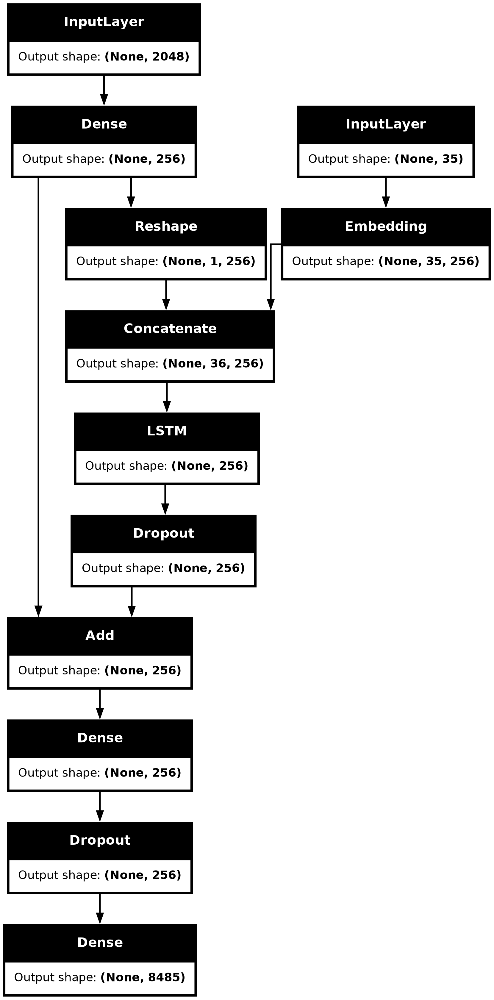

In [67]:
# Create a model with a vocabulary size of 8485 and a maximum sequence length of 35
model = create_model(vocab_size=8485, max_length=35)

# Print the summary of the model
model.summary()

# Plot the architecture of the model, showing the shapes of input and output tensors
plot_model(model, show_shapes=True)

## Step 5:Training Procedure

* ### Specify model Callbacks

In [61]:
# Define the name of the model file
model_name = "model.keras"

# Model checkpoint to save the best model based on validation loss
checkpoint = ModelCheckpoint(model_name,
                             monitor="val_loss",   # Monitor validation loss
                             mode="min",           # Minimize the monitored quantity (val_loss)
                             save_best_only=True,  # Save only the best model
                             verbose=1)            # Verbosity mode, 1 for progress bar

# Early stopping to prevent overfitting and save training time
earlystopping = EarlyStopping(monitor='val_loss',       # Monitor validation loss
                              min_delta=0,             # Minimum change in the monitored quantity to qualify as an improvement
                              patience=5,              # Number of epochs with no improvement after which training will be stopped
                              verbose=1,               # Verbosity mode, 1 for progress bar
                              restore_best_weights=True)  # Restore model weights to the best values

# Reduce learning rate when a metric has stopped improving
learning_rate_reduction = ReduceLROnPlateau(monitor='val_loss',   # Monitor validation loss
                                            patience=3,           # Number of epochs with no improvement after which learning rate will be reduced
                                            verbose=1,            # Verbosity mode, 1 for progress bar
                                            factor=0.2,           # Factor by which the learning rate will be reduced
                                            min_lr=0.00000001)    # Lower bound on the learning rate


* ### Load the dataset into training, validation then start training

In [ ]:
# Define the number of epochs and batch size
epochs = 50
batch_size = 32

# Calculate the number of steps per epoch and validation steps
steps = len(train_data) // batch_size
validation_steps = len(validation_data) // batch_size

# Initialize the data generators for training and validation
train_generator = generate_data(train_data, captions_map, features, tokenizer, max_len, vocab_size, batch_size)
validation_generator = generate_data(validation_data, captions_map, features, tokenizer, max_len, vocab_size, batch_size)

# Fit the model using generators
history = model.fit(train_generator,   # Training data generator
                    epochs=epochs,     # Number of epochs
                    steps_per_epoch=steps,  # Number of steps per epoch
                    validation_data=validation_generator,  # Validation data generator
                    validation_steps=validation_steps,     # Number of validation steps
                    callbacks=[checkpoint,earlystopping,learning_rate_reduction])  # Callbacks for model checkpointing, early stopping, and learning rate reduction

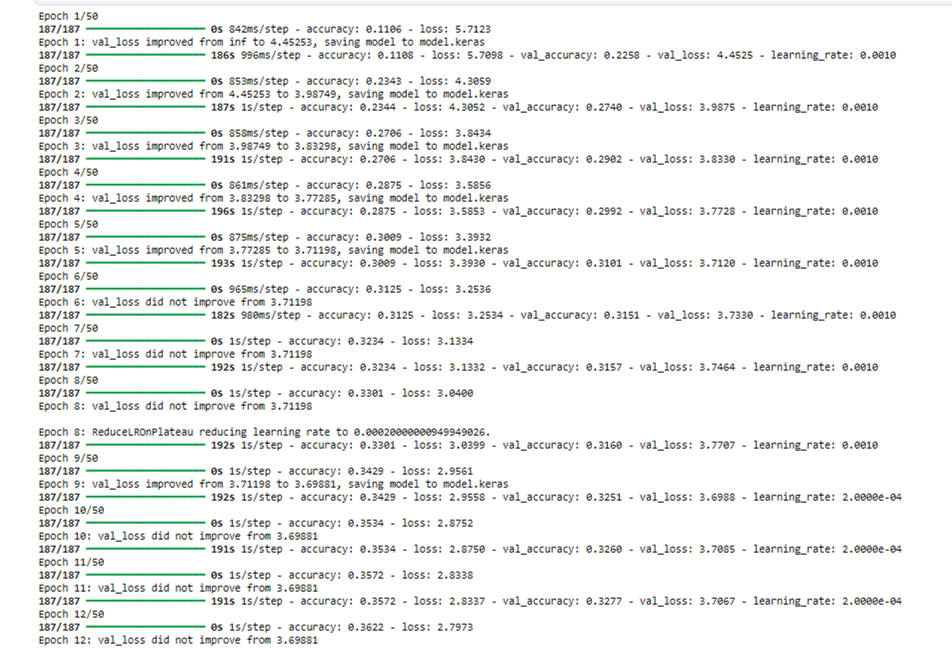
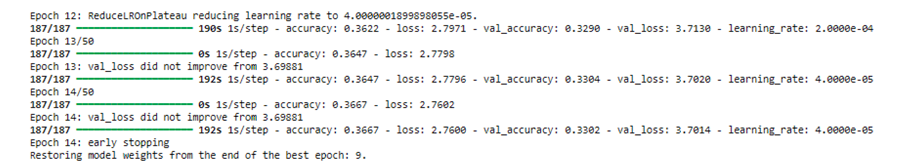

* ### Visualize training and validation comparison

In [ ]:
# Calculate the actual number of epochs from the training history
actual_epochs = len(history.history['loss'])

# Extract loss and accuracy values from the history dictionary
history_dict = history.history
loss_values = history_dict['loss']
acc_values = history_dict['accuracy']
val_loss_values = history_dict['val_loss']
val_acc_values = history_dict['val_accuracy']

# Define the range of epochs for plotting
epochs_range = range(1, actual_epochs + 1)

# Create subplots for loss and accuracy
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# Plot training and validation loss
ax1.plot(epochs_range, loss_values, 'bo', label='Training Loss')
ax1.plot(epochs_range, val_loss_values, 'orange', label='Validation Loss')
ax1.set_title('Training and validation loss')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.legend()

# Plot training and validation accuracy
ax2.plot(epochs_range, acc_values, 'bo', label='Training Accuracy')
ax2.plot(epochs_range, val_acc_values, 'orange', label='Validation Accuracy')
ax2.set_title('Training and validation accuracy')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.legend()

# Show the plots
plt.show()

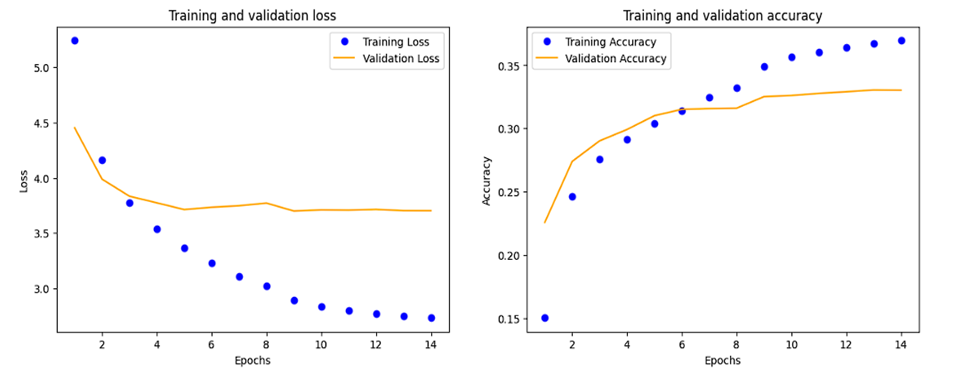

## Step 6: Caption Generation

* ### save the model and load model 

In [ ]:
# save model
model.save('/kaggle/working/model1.h5')

In [150]:
# Load the model
model = load_model('/kaggle/input/model1/pytorch/model-1/1/model1.h5')

* ### Reverse the index to word to use it in caption prediction

In [151]:
# Create the reverse dictionary
get_word = {index: word for word, index in tokenizer.word_index.items()}

In [152]:
# generate caption for an image
def predict_caption(model, image, tokenizer, max_length):
    # add start tag for generation process
    caption = 'startseq'
    for _ in range(max_length):
        sequence = tokenizer.texts_to_sequences([caption])[0]  # Encode the sequence
        
        sequence = pad_sequences([sequence], maxlen=max_length)  # Pad the sequence
        
        y = model.predict([image, sequence], verbose=0)  # Predict next word
        
        word_index = np.argmax(y)  # Get index of predicted word
        
        word = get_word.get(word_index)  # Convert index to word
        
        if word is None:
            break
        caption += ' ' + word  # Append word to caption
        if word == 'endseq':
            break
            
    return caption 

* ### Compute the BLEU score

In [ ]:
# Initialize lists to store actual and predicted captions
actual, predicted = [], []

# Loop through each image in the test data
for key in tqdm(test_data):
    # Get the actual captions for the current image
    captions = captions_map[key]
    
    # Predict the caption for the current image
    y_pred = predict_caption(model, features[key], tokenizer, max_len) 
    
    # Split actual captions into words
    actual_captions = [caption.split() for caption in captions]
    
    # Split predicted caption into words
    y_pred = y_pred.split()
    
    # Append actual and predicted captions to the lists
    actual.append(actual_captions)
    predicted.append(y_pred)
    
# Calculate BLEU score for different n-gram weights
print("BLEU-1: %f" % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print("BLEU-2: %f" % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
print("BLEU-3: %f" % corpus_bleu(actual, predicted, weights=(0.33, 0.33, 0.33, 0)))
print("BLEU-4: %f" % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))

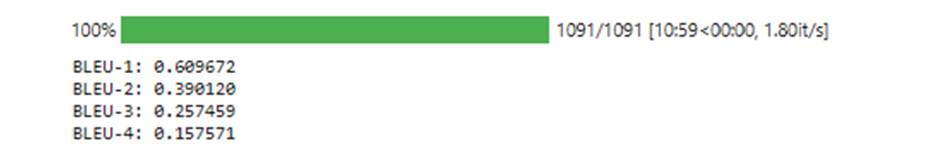



* ### Show the acutual and the predicted data with the real image

In [154]:
def generate_caption(image_name):
    # Extract image ID from the image name
    image_id = image_name.split('.')[0]
    
    # Load the image
    img_path = os.path.join('/kaggle/input/flickr8k', "Images", image_name)
    image = Image.open(img_path)
    
    # Retrieve actual captions for the image
    captions = captions_map[image_id]
    
    # Print actual captions
    print('-' * 21 + 'Actual' + '-' * 20)
    for caption in captions:
        print(caption)
    
    # Predict caption for the image
    y_pred = predict_caption(model, features[image_id], tokenizer, max_len)
    
    # Print predicted caption
    print('-' * 20 + 'Predicted' + '-' * 18)
    print(y_pred)
    
    # Display the image
    plt.imshow(image)

* ### Showcase examples from the test set

---------------------Actual--------------------
startseq dogs playing endseq
startseq brown dog is biting white and tan dog on the snout endseq
startseq the brown dog has hold of the other dogs cheek with its teeth endseq
startseq two dogs are nuzzling each other nose to nose endseq
startseq two dogs bite at each other on the carpet endseq
--------------------Predicted------------------
startseq two dogs are fighting over each other endseq


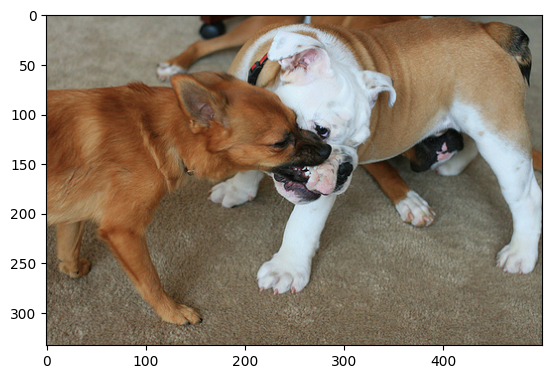

In [211]:
generate_caption(test_data[135]+".jpg")

---------------------Actual--------------------
startseq boy riding unicycle in the park endseq
startseq person is riding unicycle around orange cones endseq
startseq person riding large unicycle endseq
startseq unicycle rider in the foreground with other cyclists in the background endseq
startseq young person wearing helmet rides unicycle endseq
--------------------Predicted------------------
startseq man in black and white shirt and black shorts is riding bike on the street endseq


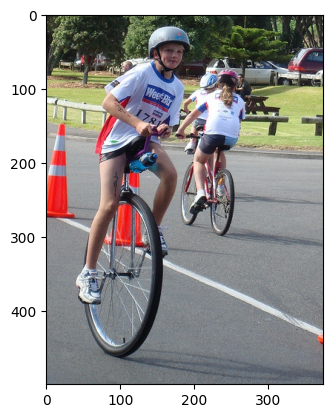

In [162]:
generate_caption(test_data[500]+".jpg")

---------------------Actual--------------------
startseq black and white dog is jumping over hurdle endseq
startseq dog hurdles over series of poles endseq
startseq dog is jumping over series of colored gates endseq
startseq dog jumping over beam endseq
startseq small black dog jumping over gates endseq
--------------------Predicted------------------
startseq black and white dog is running through an obstacle course endseq


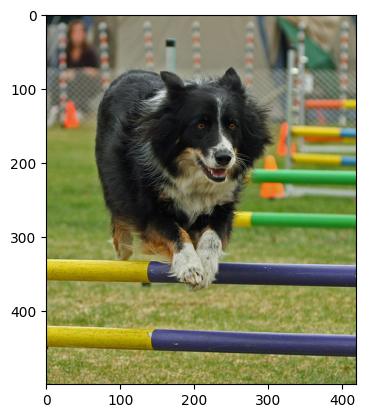

In [184]:
generate_caption(test_data[19]+".jpg")

---------------------Actual--------------------
startseq baby is dressed up in pink gear and staring while an adult holds her steady endseq
startseq small baby wearing sunglasses sits on an adult 's lap endseq
startseq woman holds fat baby with sunglasses and denim hat endseq
startseq woman is holding onto baby wearing who is wearing sunglasses endseq
startseq the baby in blue jean hat and sunglasses looks at the camera while being held endseq
--------------------Predicted------------------
startseq baby is sitting on couch endseq


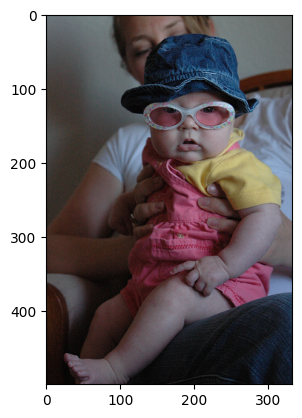

In [168]:
generate_caption(test_data[100]+".jpg")

---------------------Actual--------------------
startseq big dog chases little dog on the grass endseq
startseq black dog is chasing smaller brown dog over grass endseq
startseq the large brown dog is chasing after the little brown dog endseq
startseq two brown dogs run through the grass together endseq
startseq two dogs play in the grass endseq
--------------------Predicted------------------
startseq two dogs run in field endseq


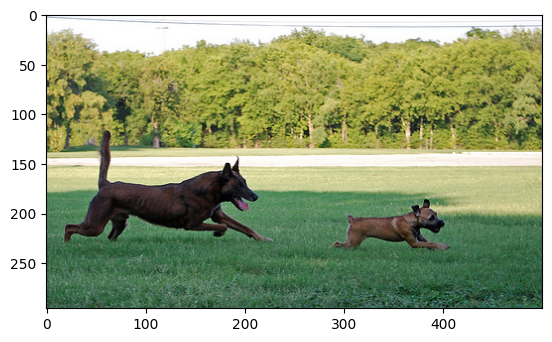

In [194]:
generate_caption(test_data[22]+".jpg")

* ### Highlight instances where the model performs poorly

---------------------Actual--------------------
startseq "a black-and-white dog bounds off the ground all feet in the air of yellow field ." endseq
startseq black and white dog is jumping over high yellow grass endseq
startseq black and white dog is jumping through field of brown grass endseq
startseq dog runs through the dry grass endseq
startseq the black and white dog runs through the field endseq
--------------------Predicted------------------
startseq two dogs running through field endseq


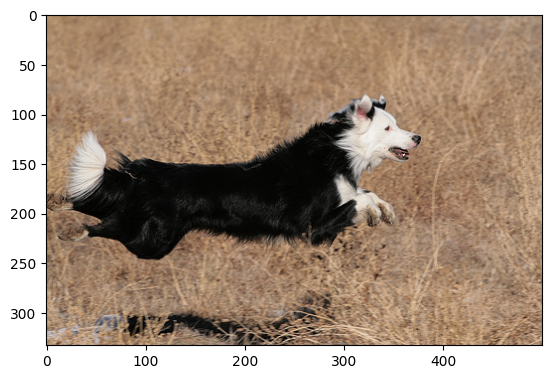

In [223]:
generate_caption(test_data[0]+".jpg")
# Here, the shadow under the dog caused the feature extraction process to mistakenly identify it as another dog, resulting in an incorrect prediction.
# dditionally, the dataset contained many instances of two dogs playing, which may have led the model to prefer combining "two" and "dogs" together in its predictions.

---------------------Actual--------------------
startseq boy plays game with wooden blocks endseq
startseq child playing with building blocks on wooden table endseq
startseq small boy is building with some wooden blocks endseq
startseq small boy wearing blue shirt stacks wooden blocks endseq
startseq boy in blue shirt looking at someone 's hand near stack of blocks on table endseq
--------------------Predicted------------------
startseq baby is eating food on the floor endseq


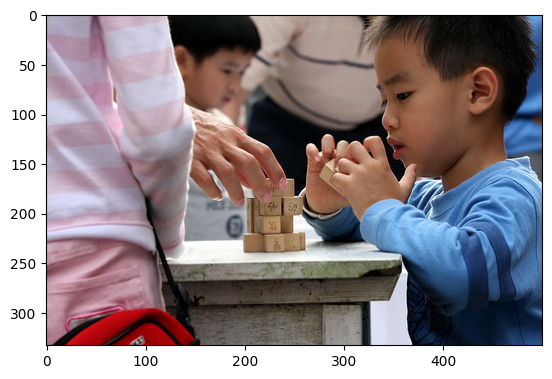

In [219]:
generate_caption(test_data[200]+".jpg")
#The model incorrectly identified the activity and context, predicting a baby eating food on the floor instead of recognizing a boy playing with wooden blocks.
#This error also stemmed from incorrect feature extraction and misidentification of the boy's actions.

---------------------Actual--------------------
startseq child in winter gear is posing while crowd of people sit and stand behind her endseq
startseq young girl dancing endseq
startseq young girl stands on one leg endseq
startseq closeup of little girl dancing endseq
startseq the little blond haired girl in grey sweatshirt dances at park with people seated behind her endseq
--------------------Predicted------------------
startseq young girl in pink shirt is reaching over the rocks endseq


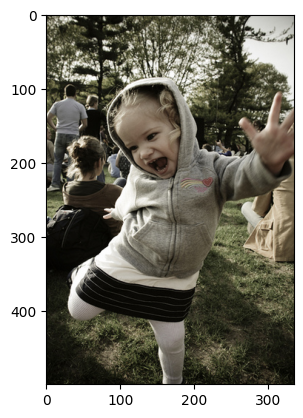

In [198]:
generate_caption(test_data[750]+".jpg") 
# The image contain elements that are not clearly distinguishable, making it difficult for the model to generate an accurate description.

---------------------Actual--------------------
startseq child rides on man 's shoulders endseq
startseq child wearing red jacket is sitting on the man 's shoulders endseq
startseq man carrying girl on his shoulders endseq
startseq small child in red jacket is sitting on man 's shoulders and holding his head endseq
startseq white man with carrying hair and beard with child on his shoulders endseq
--------------------Predicted------------------
startseq young boy wearing red hat and red hat is pointing at the camera endseq


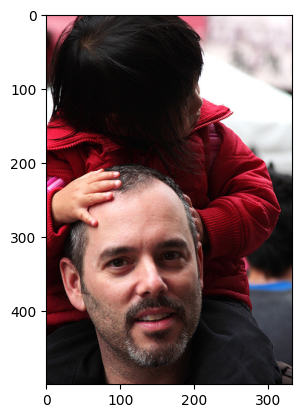

In [218]:
generate_caption(test_data[55]+".jpg")
# The overlapping details in the images made it difficult for the model to recognize and accurately identify the elements, leading to incorrect contextual understanding.

---------------------Actual--------------------
startseq child staring at santa endseq
startseq father and son looking at funny looking santa endseq
startseq little boy and his father talking to man dressed as santa claws endseq
startseq the child is looking at santa claus endseq
startseq the little boy has yellow crown and the man is wearing red velvet endseq
--------------------Predicted------------------
startseq man in yellow shirt is playing with brown haired man endseq


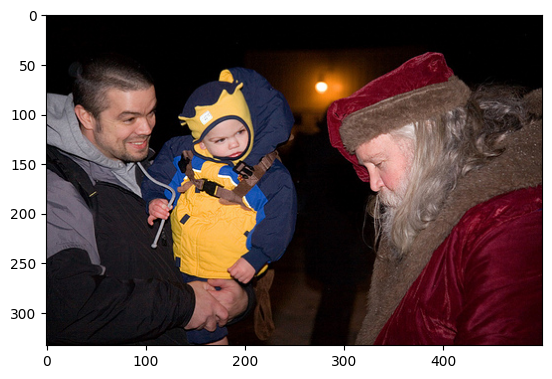

In [221]:
generate_caption(test_data[1]+".jpg")
# The model incorrectly identifies the people involved in the scene, and the actions they are doing

## Step 7:use images from the internet for testing

In [224]:
def test_img(image_path):
    # Load and preprocess the image
    clean_img = load_and_preprocess_image(image_path)
    
    # Extract image features using the CNN model
    features = cnn_model(clean_img)
    
    # Predict caption for the image features
    y_pred = predict_caption(model, features, tokenizer, max_len)
    
    # Display the predicted caption and the image
    print('-' * 20 + 'Predicted' + '-' * 18)
    plt.imshow(Image.open(image_path))
    plt.title(y_pred)
    plt.axis('off')  # Hide axes for better visual presentation
    plt.show()  # Ensure the image and caption are displayed

  0%|          | 0/22 [00:00<?, ?it/s]

--------------------Predicted------------------


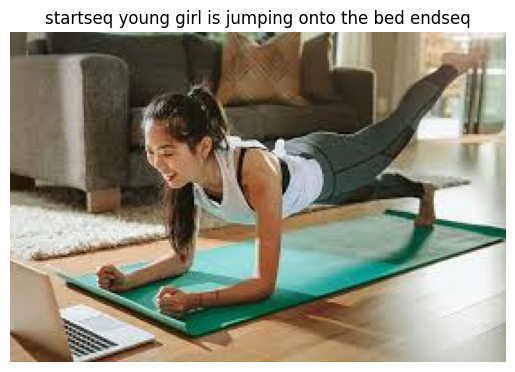

--------------------Predicted------------------


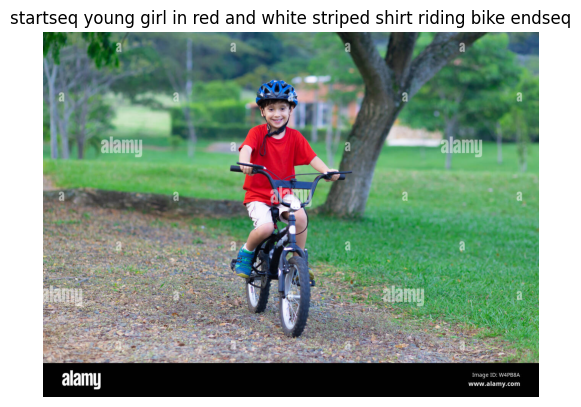

--------------------Predicted------------------


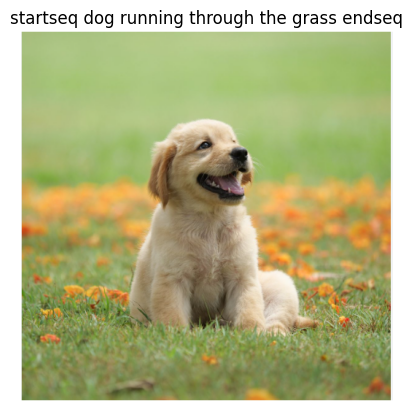

--------------------Predicted------------------


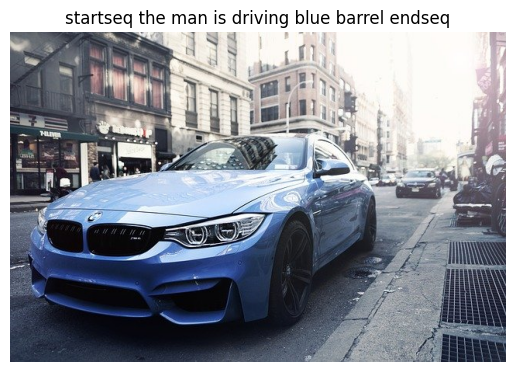

--------------------Predicted------------------


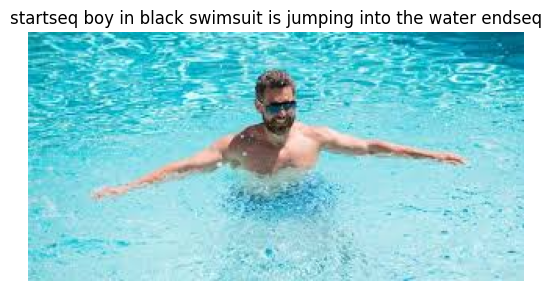

--------------------Predicted------------------


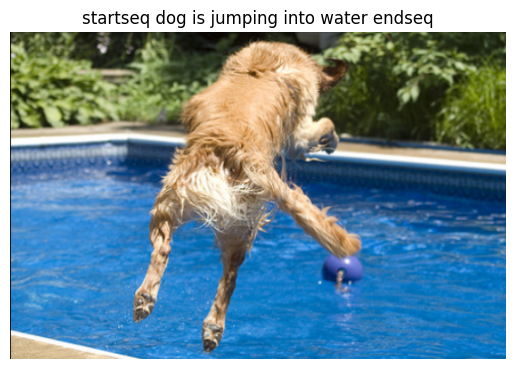

--------------------Predicted------------------


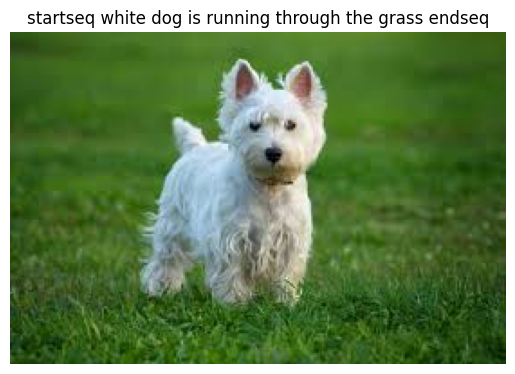

--------------------Predicted------------------


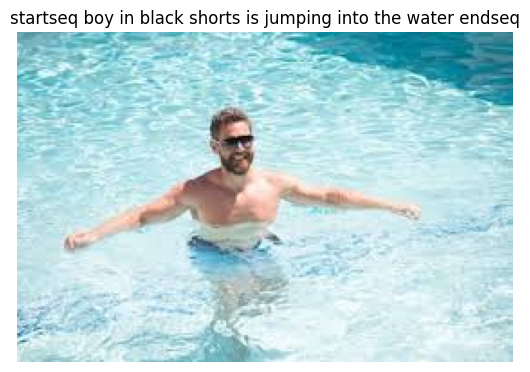

--------------------Predicted------------------


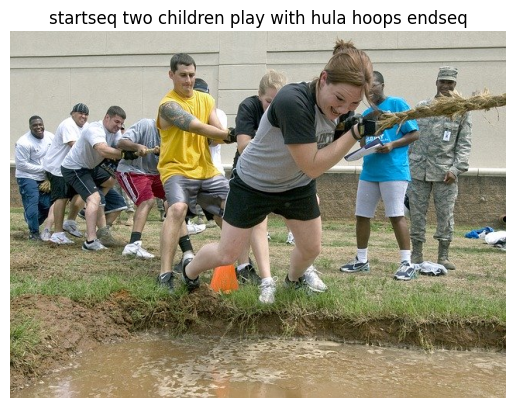

--------------------Predicted------------------


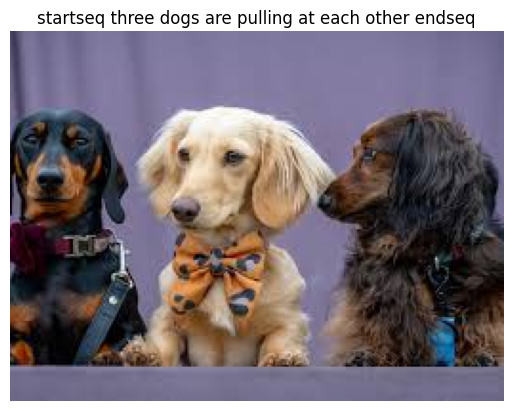

--------------------Predicted------------------


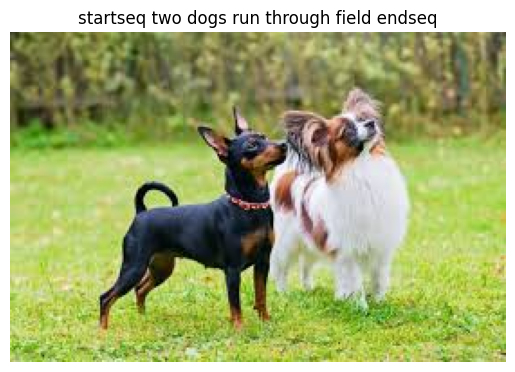

--------------------Predicted------------------


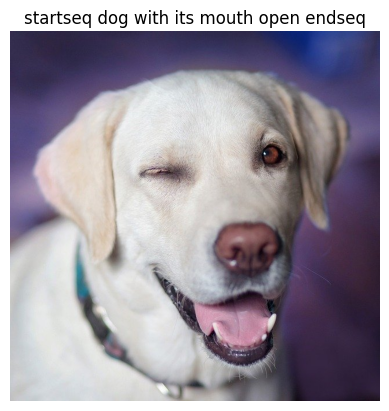

--------------------Predicted------------------


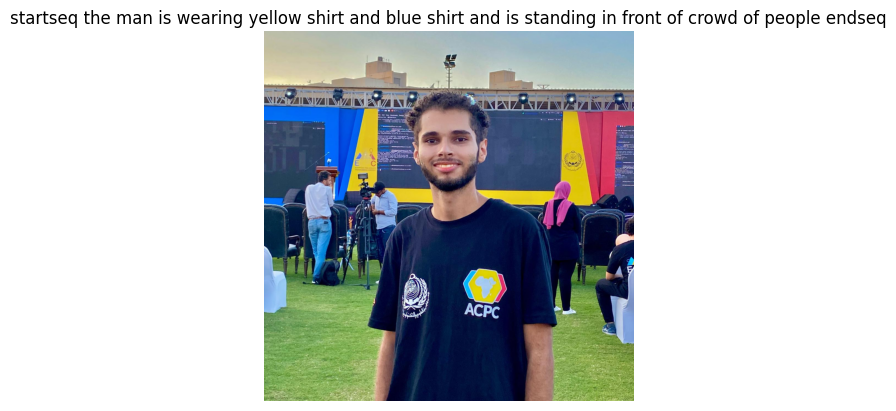

--------------------Predicted------------------


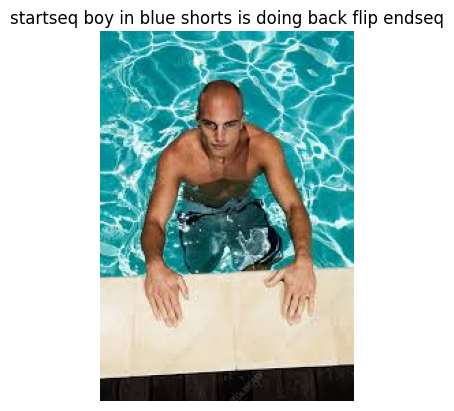

--------------------Predicted------------------


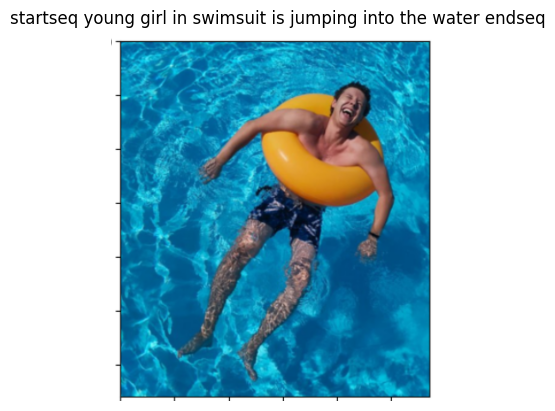

--------------------Predicted------------------


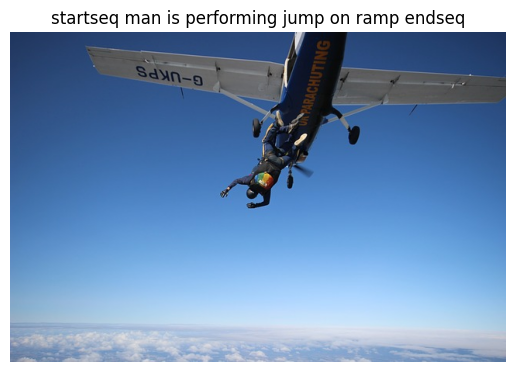

--------------------Predicted------------------


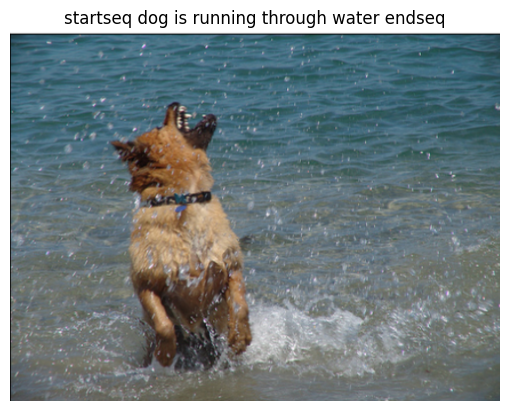

--------------------Predicted------------------


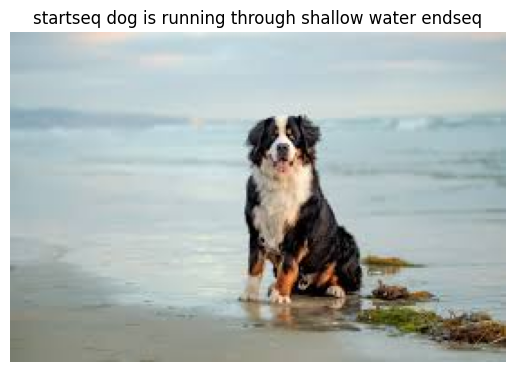

--------------------Predicted------------------


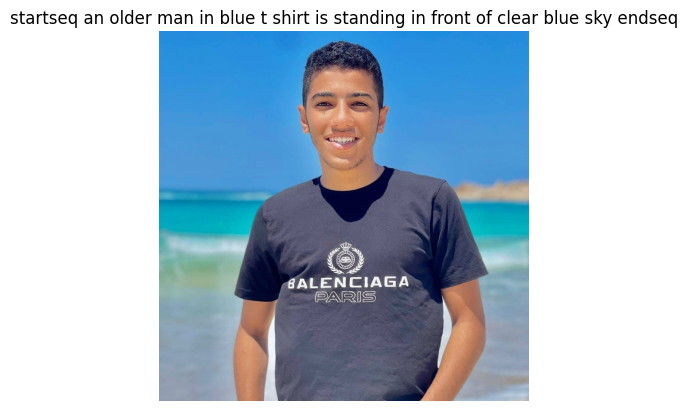

--------------------Predicted------------------


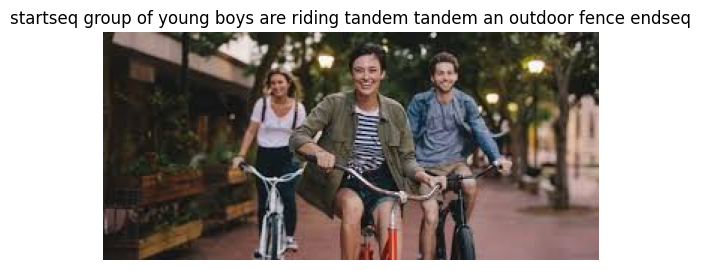

--------------------Predicted------------------


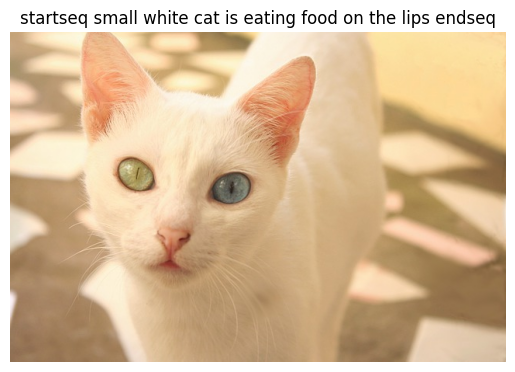

--------------------Predicted------------------


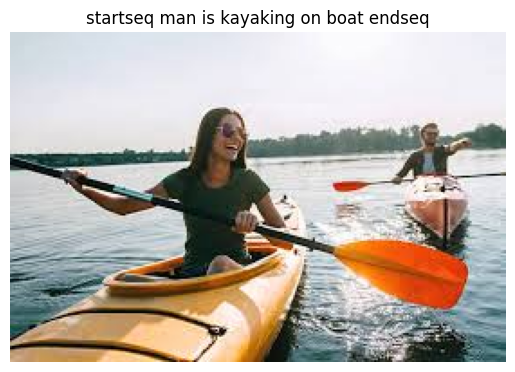

In [228]:
# Define the path to the directory containing the testing images
test_imgs_path = '/kaggle/input/test-data'

# Get a list of all files in the specified directory
files = os.listdir(test_imgs_path)

# Loop over each file in the directory, using tqdm to display a progress bar
for image_file in tqdm(files):
    # Construct the full path to the image file by joining the directory path and the file name
    image_path = os.path.join(test_imgs_path, image_file)
    
    # Call the test_img function with the full path of the image file as an argument
    test_img(image_path)